# Kaggle: Global Wheat Detection

In 2020, the Global Wheat Detection competition challenged Kagglers to build a model to detect wheat heads from outdoor images of wheat plants, including wheat datasets from around the world.<br><br>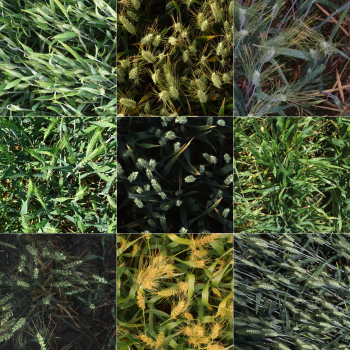<br>

> To get large and accurate data about wheat fields worldwide, plant scientists use image detection of "wheat heads"—spikes atop the plant containing grain. These images are used to estimate the density and size of wheat heads in different varieties. Farmers can use the data to assess health and maturity when making management decisions in their fields.


The metric used in this competition is **Mean Average Precision** at different intersection over union (IoU) thresholds.

More details on the data acquisition and processes are available at https://arxiv.org/abs/2005.02162<br>
You can download the dataset at https://www.kaggle.com/competitions/global-wheat-detection/data<br>

Structure of the dataset:
```
test/
    ├──2fd875eaa.jpg
    ├──348a992bb.jpg
    ├──51b3e36ab.jpg
    ...
train/
    ├──00333207f.jpg
    ├──005b0d8bb.jpg
    ├──006a994f7.jpg
    ...
sample_submission.csv
train.csv
```

In [4]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import shutil
from tqdm import tqdm
import yaml
from ultralytics import YOLO

# Configurations

In [1]:
# Path to the data directory
DATA_DIR = 'raw_data/train'

# Path to the train csv files
TRAIN_CSV = 'raw_data/train.csv'

# Path to the test directory
TEST_DIR = 'raw_data/test'

In [3]:
# Function show sample images

def show_images(df, num_images=9):
    # Get the filenames from the csv file
    filenames = df['image_id'].unique().tolist()
    # Select a random sample of images from the filenames list
    random_files = np.random.choice(filenames, num_images)
    # Read the images and display them
    fig = plt.figure(figsize=(14, 14))
    for i, image_id in enumerate(random_files):
        image_path = os.path.join(DATA_DIR, image_id + '.jpg')
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax = fig.add_subplot(3, 3, i + 1, xticks=[], yticks=[])
        for _, row in df[df['image_id'] == image_id].iterrows():
            x, y, w, h = row['x'], row['y'], row['w'], row['h']
            cv2.rectangle(image, (x, y), (x+w, y+h), (255, 0, 0), 2)
        plt.imshow(image)
        plt.axis('off')
        ax.set_title(f'Image: {image_id}')

In [4]:
# Function create annotation files

def create_annotation_files(df, output_dir):
    for filename in tqdm(df['image_id'].unique(), desc='Creating annotation files', total=len(df['image_id'].unique())):
        annotation_file = os.path.join(output_dir, filename + '.txt')
        with open(annotation_file, 'w+') as f:
            for _, row in df[df['image_id'] == filename].iterrows():
                class_id = 0
                x, y, w, h = row['x'], row['y'], row['w'], row['h']
                image_width = row['width']
                image_height = row['height']
                x_center = x + w / 2
                y_center = y + h / 2
                x_rel = x_center / image_width
                y_rel = y_center / image_height
                w_rel = w / image_width
                h_rel = h / image_height
                f.write(f'{class_id} {x_rel} {y_rel} {w_rel} {h_rel}\n')

In [5]:
# Function copy images to a new directory

def copy_images(df, output_dir):
    for filename in tqdm(df['image_id'].unique(), desc='Copying images', total=len(df['image_id'].unique())):
        image_file = os.path.join(DATA_DIR, filename + '.jpg')
        output_file = os.path.join(output_dir, filename + '.jpg')
        shutil.copy(image_file, output_file)

# Explore dataset

In [6]:
df = pd.read_csv(TRAIN_CSV)
df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147793 entries, 0 to 147792
Data columns (total 5 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   image_id  147793 non-null  object
 1   width     147793 non-null  int64 
 2   height    147793 non-null  int64 
 3   bbox      147793 non-null  object
 4   source    147793 non-null  object
dtypes: int64(2), object(3)
memory usage: 5.6+ MB


In [8]:
print('Dataset has', df['image_id'].nunique(), 'images')

Dataset has 3373 images


In [9]:
df['width'].value_counts()

width
1024    147793
Name: count, dtype: int64

In [10]:
df['height'].value_counts()

height
1024    147793
Name: count, dtype: int64

**Size of the images in the dataset is (1024, 1024)**

In [11]:
# Split bbox column into x, y, w, h columns

df['bbox'] = df['bbox'].apply(lambda x: x[1:-1].split(','))
df[['x', 'y', 'w', 'h']] = pd.DataFrame(df['bbox'].tolist(), index=df.index).astype(float).astype(int)

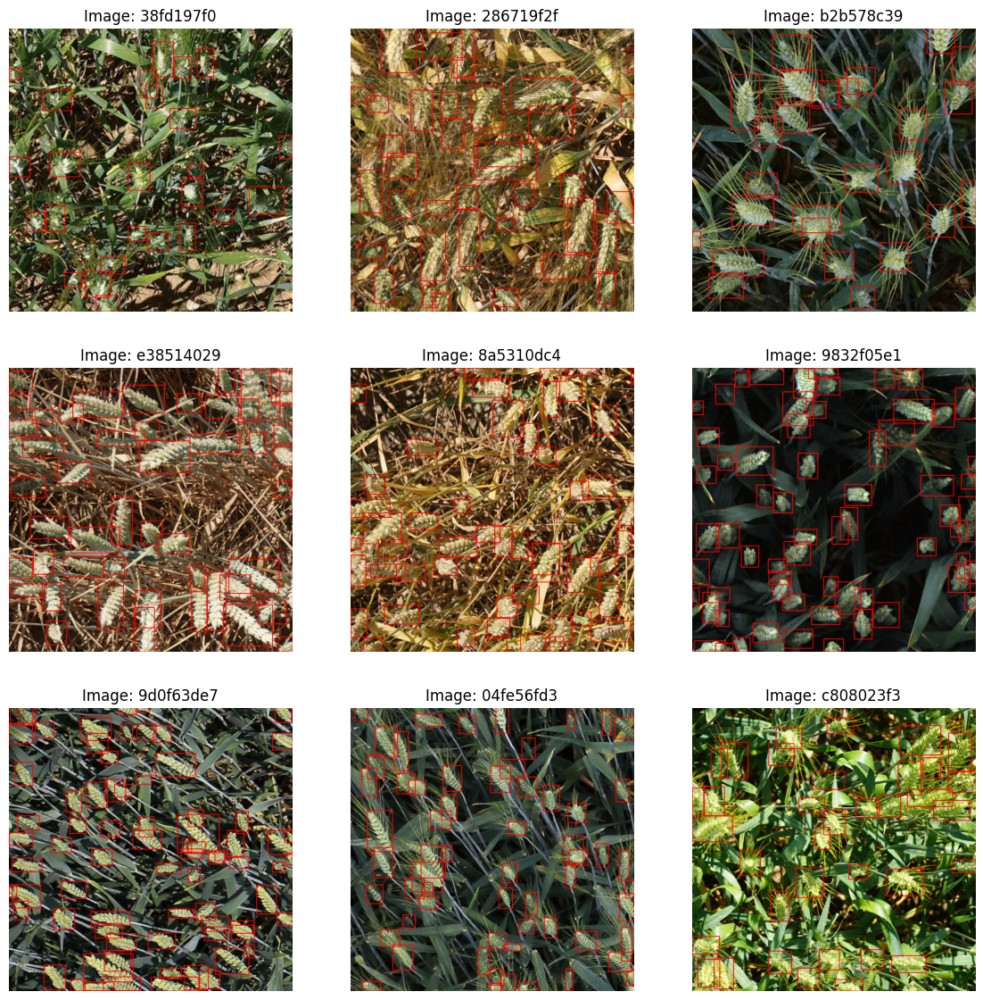

In [12]:
# Show sample images

np.random.seed(42)
show_images(df)

# Prepare data

In [13]:
all_images = df['image_id'].unique()

In [14]:
np.random.seed(42)
train_images = np.random.choice(all_images, int(len(all_images) * 0.8), replace=False)

In [15]:
df_train = df[df['image_id'].isin(train_images)]
df_valid = df[~df['image_id'].isin(train_images)]

In [16]:
print('Shape of training dataframe:', df_train.shape)
print('Shape of validation dataframe:', df_valid.shape)

Shape of training dataframe: (118335, 9)
Shape of validation dataframe: (29458, 9)


**YOLO dataset structure**

```
datasets/
    ├──images/
        ├──train/
        ├──valid/
    ├──labels/
        ├──train/
        ├──valid/
```

In [17]:
# Create training data folder

for folder in ['images', 'labels']:
    for subfolder in ['train', 'valid']:
        os.makedirs(os.path.join('datasets', folder, subfolder), exist_ok=True)

In [18]:
# Create annotation files

create_annotation_files(df_train, 'datasets/labels/train')
create_annotation_files(df_valid, 'datasets/labels/valid')

Creating annotation files:   0%|          | 0/2698 [00:00<?, ?it/s]

Creating annotation files: 100%|██████████| 675/675 [00:03<00:00, 203.13it/s]


In [19]:
# Copy images to the new directory

copy_images(df_train, 'datasets/images/train')
copy_images(df_valid, 'datasets/images/valid')

Copying images: 100%|██████████| 675/675 [00:04<00:00, 165.59it/s]


In [20]:
# Create dataset config file

dataset_config = {
    'path': '.',
    'train': 'images/train',
    'val': 'images/valid',
    'nc': 1,  # number of classes
    'names': ['wheat']
}
yaml.dump(dataset_config, open('data.yaml', 'w'))

# Augmentation

In [21]:
import albumentations as A

In [22]:
augmentations = [
    A.RandomCrop(width=640, height=640, p=1),
    A.HorizontalFlip(p=1),
    A.VerticalFlip(p=1),
    A.PixelDropout(dropout_prob=0.1, drop_value=None, p=1),
]

In [23]:
for dataset in ['train']:
    for image_file in tqdm(os.listdir(f'datasets/images/{dataset}'), desc=f'Augmenting {dataset} images', total=len(os.listdir(f'datasets/images/{dataset}'))):
        image_id = image_file[:-len('.jpg')]
        img = cv2.imread(f'datasets/images/{dataset}/{image_id}.jpg')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        bboxes = []
        with open(f'datasets/labels/{dataset}/{image_id}.txt', 'r') as f:
            for line in f.readlines():
                class_id, x, y, w, h = line.strip().split()
                bboxes.append([float(x), float(y), float(w), float(h), class_id])

        for aug in augmentations:
            transform = A.Compose([
                aug,
            ], bbox_params=A.BboxParams(format='yolo',  min_visibility=0.2))
            transformed = transform(image=img, bboxes=bboxes)

            transformed_image = transformed['image']
            transformed_bboxes = transformed['bboxes']

            image_width = transformed_image.shape[1]
            image_height = transformed_image.shape[0]

            transformed_image = cv2.cvtColor(transformed_image, cv2.COLOR_RGB2BGR)
            cv2.imwrite(f'datasets/images/{dataset}/{image_id}_{aug.__class__.__name__}.jpg', transformed_image)
            with open(f'datasets/labels/{dataset}/{image_id}_{aug.__class__.__name__}.txt', 'w') as f:
                for bbox in transformed_bboxes:
                    x, y, w, h, class_id = bbox
                    f.write(f'{class_id} {x} {y} {w} {h}\n')


Augmenting train images:   0%|          | 0/2698 [00:00<?, ?it/s]

Augmenting train images: 100%|██████████| 2698/2698 [05:51<00:00,  7.66it/s]


# Summary

|   | Precision | Recall | mAP50 | mAP50-95 |
|---|-----------|--------|-------|----------|
| yolov8n 320x320 | 0.898 | 0.833 | 0.905 | 0.501 |
| **yolov8n 320x320 augmented** | **0.911** | **0.850** | **0.917** | **0.519** |

You can see compare my experiments on [Comet](https://www.comet.com/tdbui1209/global-wheat-detection/view/oNIXlg7DF2XTWUIwF2jeytHyi/panels).

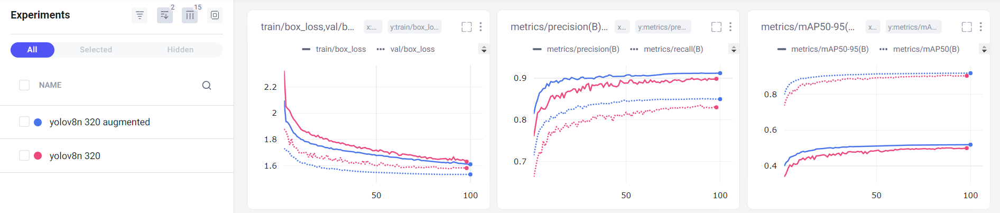

# Predict

In [ ]:
# !yolo detect predict model=best.pt source='raw_data/test' save_conf=True save_txt=True

In [30]:
RESULT_DIR = 'runs\detect\predict\labels'

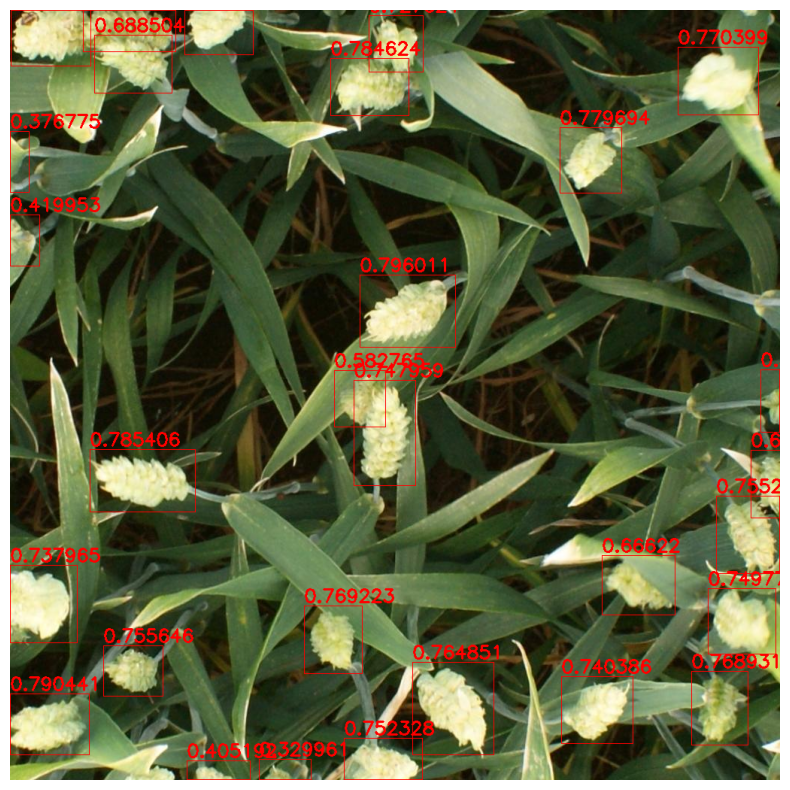

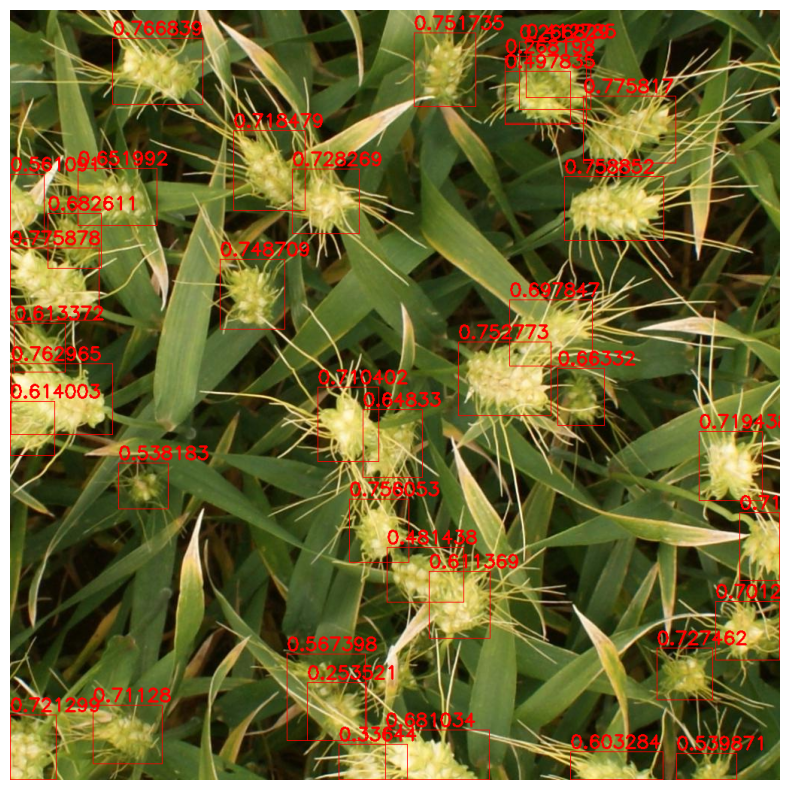

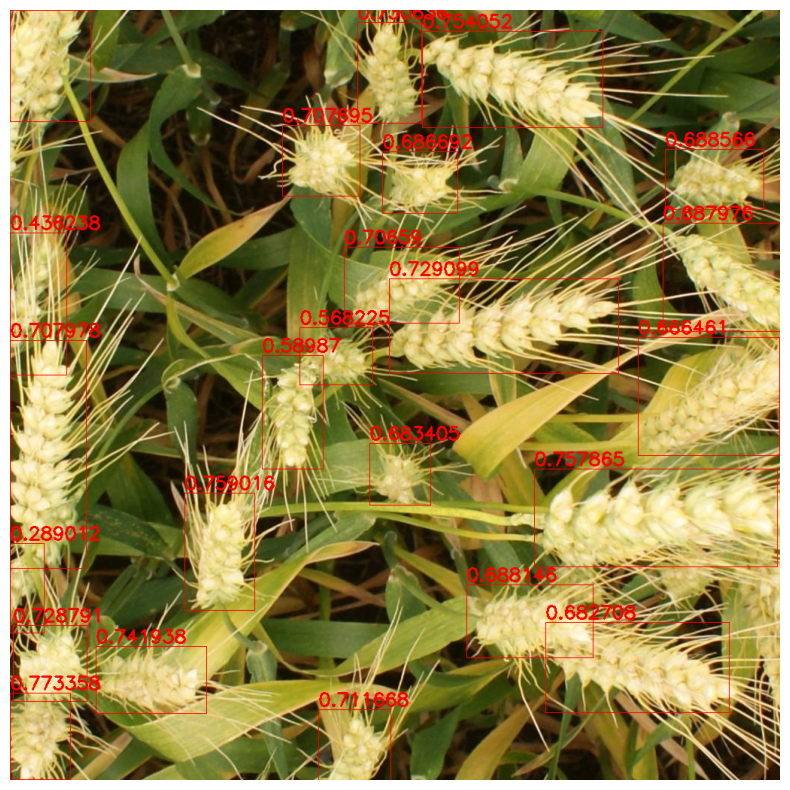

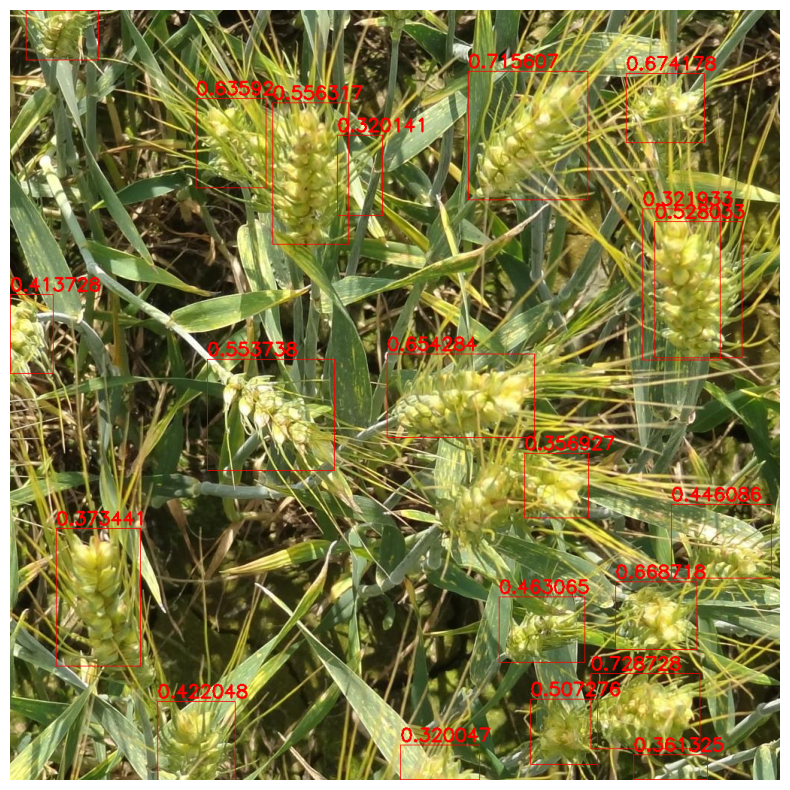

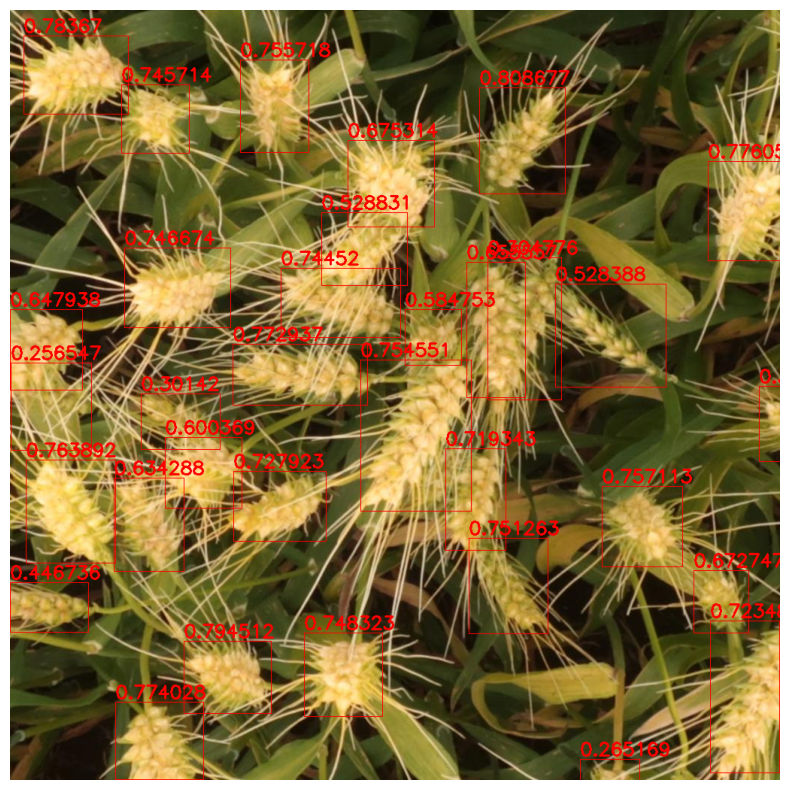

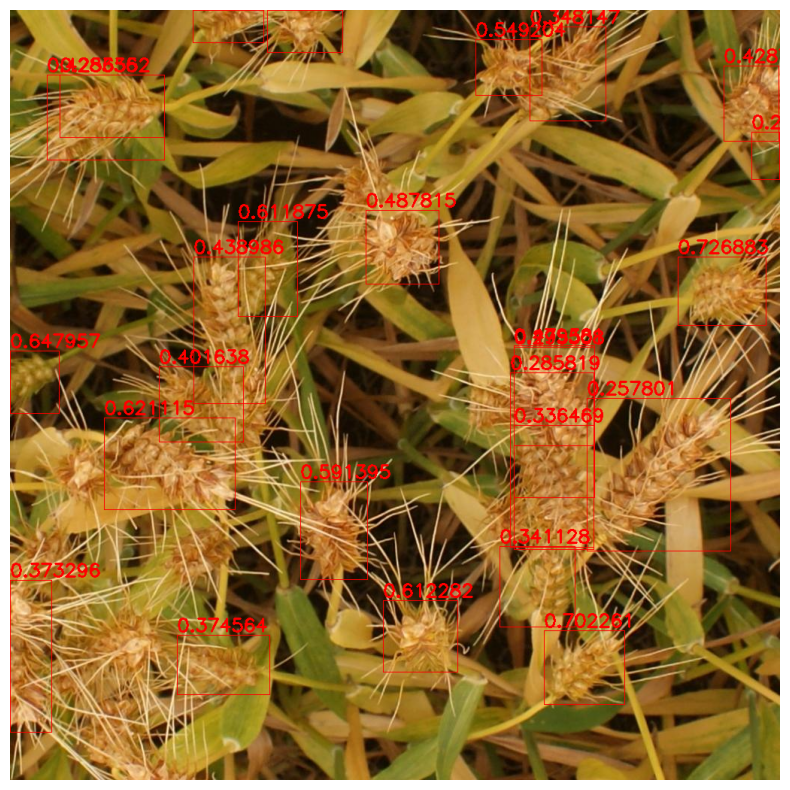

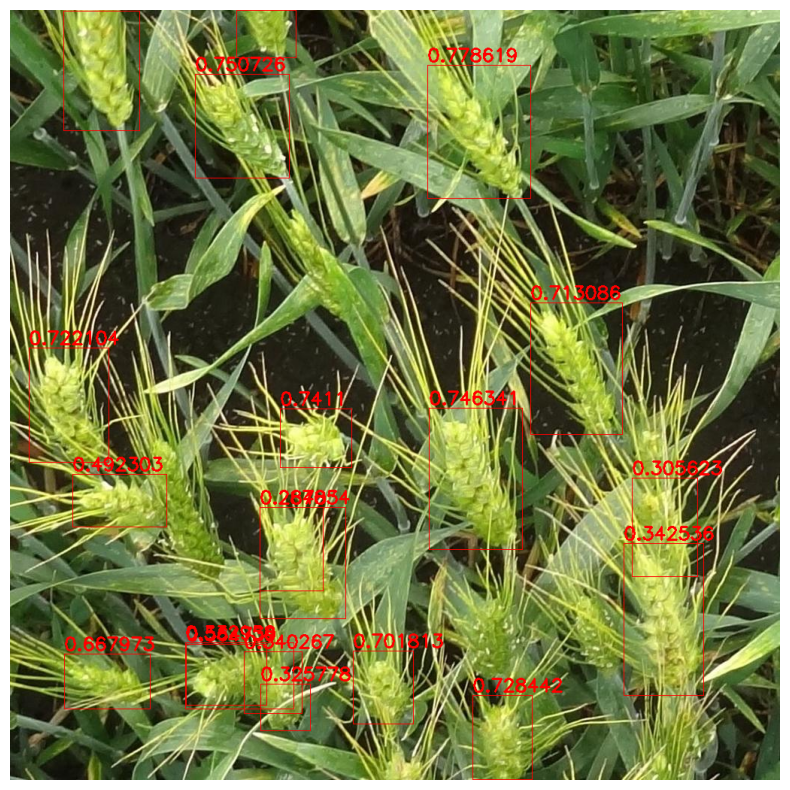

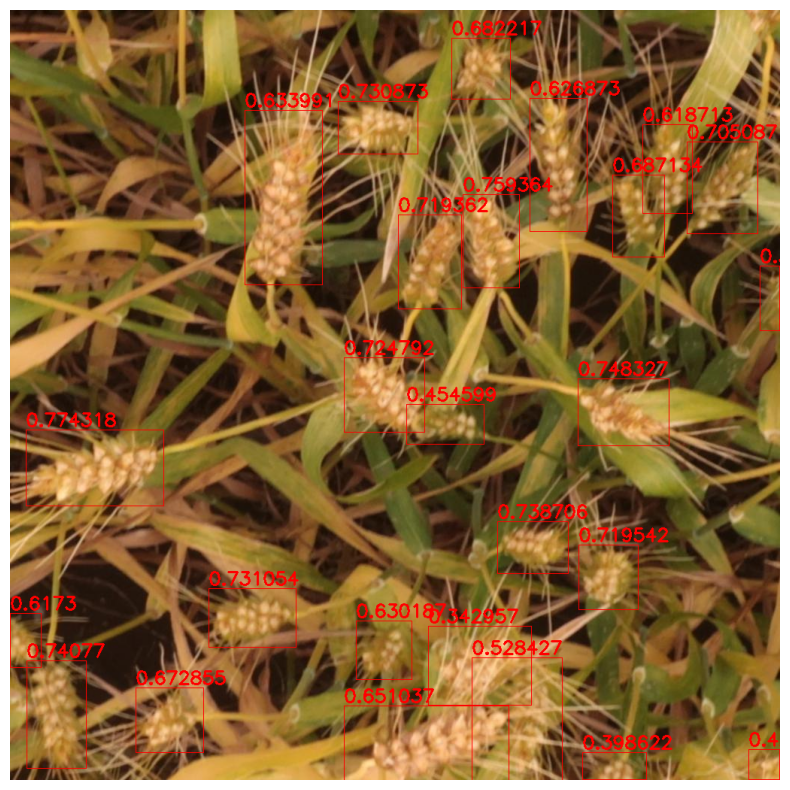

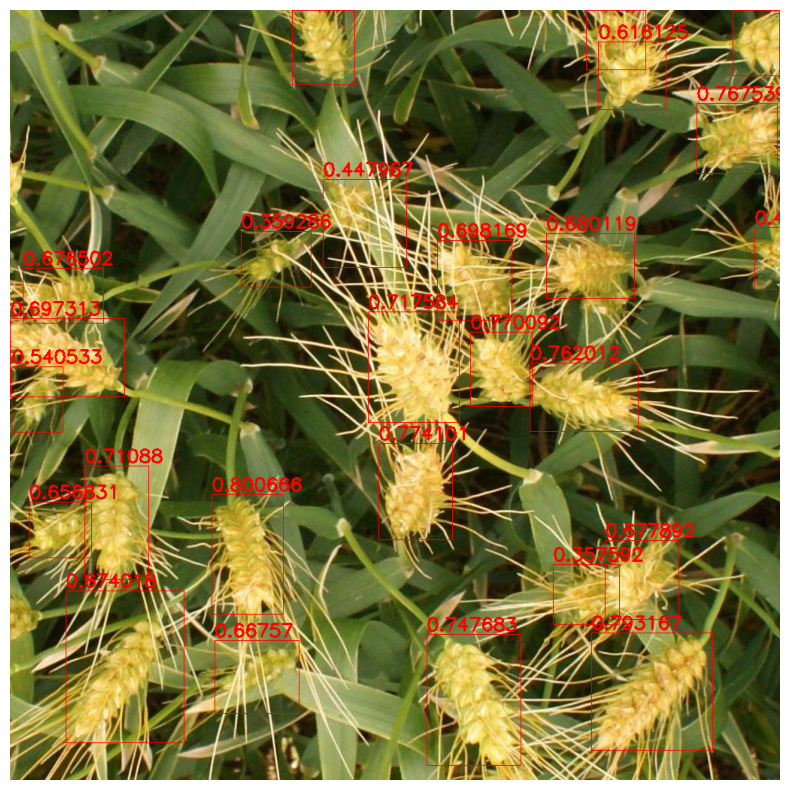

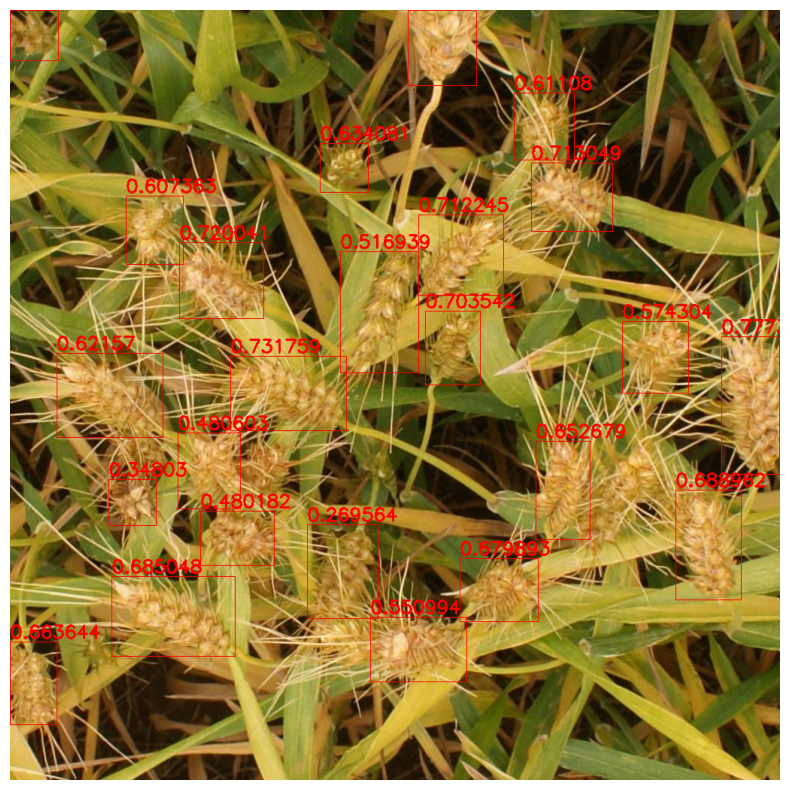

In [60]:
for image_file in os.listdir(TEST_DIR):
    plt.figure(figsize=(10, 10))
    img = cv2.imread(os.path.join(TEST_DIR, image_file))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    image_width = img.shape[1]
    image_height = img.shape[0]

    with open(os.path.join(RESULT_DIR, image_file[:-len('.jpg')] + '.txt'), 'r') as f:
        for line in f.readlines():
            class_id, x, y, w, h, conf = line.strip().split()
            x = float(x)
            y = float(y)
            w = float(w)
            h = float(h)
            x1 = int((x - w / 2) * image_width)
            y1 = int((y - h / 2) * image_height)
            x2 = int((x + w / 2) * image_width)
            y2 = int((y + h / 2) * image_height)
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 1)

            cv2.putText(img, f'{conf}', (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
    plt.axis('off')
    plt.imshow(img)


***With the limited of time and resource, the result is still good enough for me. I will try to improve the model in the future like use other size of image, more image augmentation, etc. Thank you for reading my notebook. I hope you enjoy it.***